<a href="https://colab.research.google.com/github/kurrosan/Neural-networks/blob/main/neural_networks.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Создание нейронной сети для распознавания и анализа эмоций на лицах людей по видеофрагментам

In [ ]:
!pip install transformers

In [ ]:
from tensorflow.keras.callbacks import LearningRateScheduler

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

In [ ]:
!pip install tensorflow keras opencv-python numpy pandas

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
img_size = (48, 48)
num_classes = 7

In [ ]:
model = models.Sequential()

In [ ]:
# Добавление слоя свертки с 64 фильтрами размером (3, 3), функцией активации ReLU
# и указанием входной формы данных (48, 48, 1) для изображений размером 48x48 пикселей в оттенках серого.
model.add(layers.Conv2D(64, (3, 3), activation='relu', input_shape=(48, 48, 1)))

# Добавление еще одного слоя свертки с 64 фильтрами размером (3, 3) и функцией активации ReLU.
model.add(layers.Conv2D(64, (3, 3), activation='relu'))

# Добавление слоя максимального пулинга с окном размером (2, 2),
# который помогает уменьшить размерность данных и выделить основные признаки.
model.add(layers.MaxPooling2D(pool_size=(2, 2)))

# Добавление слоя dropout с коэффициентом отсева 0.25,
# который случайным образом "выключает" некоторые нейроны в процессе обучения,
# чтобы предотвратить переобучение модели.
model.add(layers.Dropout(0.25))


In [ ]:
# Добавление слоя свертки с 128 фильтрами размером (3, 3) и функцией активации ReLU.
model.add(layers.Conv2D(128, (3, 3), activation='relu'))

# Добавление еще одного слоя свертки с 128 фильтрами размером (3, 3) и функцией активации ReLU.
model.add(layers.Conv2D(128, (3, 3), activation='relu'))

# Добавление слоя максимального пулинга с окном размером (2, 2),
# который помогает уменьшить размерность данных и выделить основные признаки.
model.add(layers.MaxPooling2D(pool_size=(2, 2)))

# Добавление слоя dropout с коэффициентом отсева 0.25,
# который случайным образом "выключает" некоторые нейроны в процессе обучения,
# чтобы предотвратить переобучение модели.
model.add(layers.Dropout(0.25))


In [ ]:
# Добавление слоя свертки с 256 фильтрами размером (3, 3) и функцией активации ReLU.
model.add(layers.Conv2D(256, (3, 3), activation='relu'))

# Добавление еще одного слоя свертки с 256 фильтрами размером (3, 3) и функцией активации ReLU.
model.add(layers.Conv2D(256, (3, 3), activation='relu'))

# Добавление слоя максимального пулинга с окном размером (2, 2),
# который помогает уменьшить размерность данных и выделить основные признаки.
model.add(layers.MaxPooling2D(pool_size=(2, 2)))

# Добавление слоя dropout с коэффициентом отсева 0.25,
# который случайным образом "выключает" некоторые нейроны в процессе обучения,
# чтобы предотвратить переобучение модели.
model.add(layers.Dropout(0.25))


In [ ]:
# Добавление слоя Flatten, который преобразует трехмерные данные в одномерный вектор,
# чтобы подготовить данные для полносвязного слоя.
model.add(layers.Flatten())

# Добавление полносвязного слоя с 1024 нейронами и функцией активации ReLU.
model.add(layers.Dense(1024, activation='relu'))

# Добавление слоя dropout с коэффициентом отсева 0.5,
# который случайным образом "выключает" некоторые нейроны в процессе обучения,
# чтобы предотвратить переобучение модели.
model.add(layers.Dropout(0.5))

# Добавление полносвязного слоя с количеством нейронов, равным числу классов (num_classes),
# и функцией активации softmax, которая используется для многоклассовой классификации.
model.add(layers.Dense(num_classes, activation='softmax'))


In [ ]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 46, 46, 64)        640       
                                                                 
 conv2d_13 (Conv2D)          (None, 44, 44, 64)        36928     
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 22, 22, 64)        0         
 g2D)                                                            
                                                                 
 dropout_8 (Dropout)         (None, 22, 22, 64)        0         
                                                                 
 conv2d_14 (Conv2D)          (None, 20, 20, 128)       73856     
                                                                 
 conv2d_15 (Conv2D)          (None, 18, 18, 128)       147584    
                                                      

In [ ]:
# Создание объекта ImageDataGenerator для аугментации обучающих данных.
train_datagen = ImageDataGenerator(
    rescale=1./255,             # Нормализация значений пикселей к диапазону [0, 1].
    rotation_range=15,          # Вращение изображений на случайный угол до 15 градусов.
    width_shift_range=0.1,      # Случайный сдвиг по ширине в пределах 10% от ширины изображения.
    height_shift_range=0.1,     # Случайный сдвиг по высоте в пределах 10% от высоты изображения.
    shear_range=0.2,            # Наклон изображений на случайный угол.
    zoom_range=0.2,             # Случайное масштабирование изображений.
    horizontal_flip=True,       # Случайное отражение по горизонтали.
    fill_mode='nearest'         # Способ заполнения пикселей при аугментации.
)

# Создание генератора данных из изображений в указанной директории.
train_generator = train_datagen.flow_from_directory(
    '/kaggle/input/archive/archive',  # Путь к папке с обучающими изображениями.
    target_size=img_size,              # Размер изображений после загрузки.
    color_mode='grayscale',            # Использование изображений в оттенках серого.
    batch_size=32,                     # Размер пакета (batch size) для обучения.
    class_mode='categorical'           # Тип задачи - многоклассовая классификация.
)


Found 30080 images belonging to 1 classes.


In [ ]:
# Определение функции, которая будет управлять изменением learning rate в процессе обучения.
def lr_schedule(epoch):
    initial_learning_rate = 0.001  # Начальная скорость обучения.
    decay = 0.9                    # Коэффициент уменьшения скорости обучения.

    # Уменьшение скорости обучения на 10% каждые 10 эпох, начиная с первой эпохи.
    if epoch % 10 == 0 and epoch != 0:
        return initial_learning_rate * decay
    return initial_learning_rate

# Создание объекта LearningRateScheduler с использованием определенной функции lr_schedule.
lr_scheduler = LearningRateScheduler(lr_schedule)


In [ ]:
model.fit(
    train_generator,
    epochs=50,  # Увеличьте количество эпох при необходимости
    steps_per_epoch=train_generator.samples // 32,
    callbacks=[lr_scheduler]
)
# Сохраняем обученную модель
model.save('emotion_model.h5')


Epoch 1/50


2024-01-21 14:07:43.755463: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_2/dropout_8/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


940/940 [==============================] - 52s 52ms/step - loss: 998776296584511488.0000 - accuracy: 0.1987 - lr: 0.0010
Epoch 2/50
940/940 [==============================] - 46s 49ms/step - loss: 27336499200.0000 - accuracy: 0.1838 - lr: 0.0010
Epoch 3/50
940/940 [==============================] - 47s 50ms/step - loss: 39825547264.0000 - accuracy: 0.1785 - lr: 0.0010
Epoch 4/50
940/940 [==============================] - 49s 53ms/step - loss: 53014953984.0000 - accuracy: 0.1788 - lr: 0.0010
Epoch 5/50
940/940 [==============================] - 52s 55ms/step - loss: 66617991168.0000 - accuracy: 0.1754 - lr: 0.0010
Epoch 6/50
940/940 [==============================] - 49s 52ms/step - loss: 80428359680.0000 - accuracy: 0.1724 - lr: 0.0010
Epoch 7/50
940/940 [==============================] - 46s 49ms/step - loss: 94959869952.0000 - accuracy: 0.1750 - lr: 0.0010
Epoch 8/50
940/940 [==============================] - 45s 48ms/step - loss: 109354688512.0000 - accuracy: 0.1734 - lr: 0.0010
Epo

In [ ]:
from tensorflow.keras.models import load_model

model = load_model('emotion_model.h5')

In [ ]:
import cv2
import numpy as np


In [ ]:
pip install --upgrade opencv-python

Note: you may need to restart the kernel to use updated packages.


In [ ]:
emotion_labels = ['Angry', 'Disgust', 'Fear', 'Happy', 'Sad', 'Surprise', 'Neutral']

In [ ]:
video_path = '/kaggle/input/angry-2/.mp4'
cap = cv2.VideoCapture(video_path)

In [ ]:
pip install opencv-python


Note: you may need to restart the kernel to use updated packages.


1/1 [==============================] - 0s 110ms/step


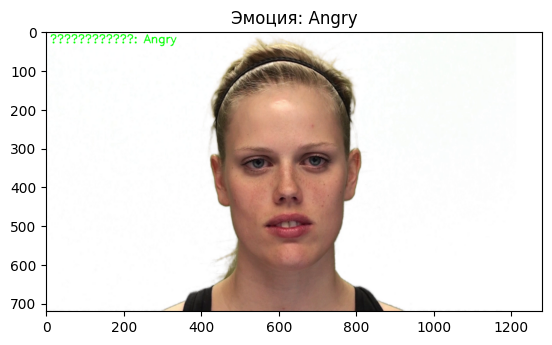

Эмоция: Angry
1/1 [==============================] - 0s 20ms/step


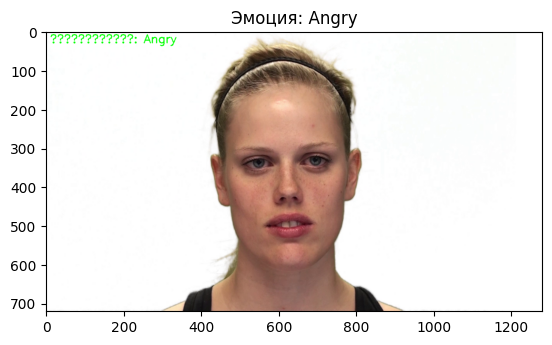

Эмоция: Angry
1/1 [==============================] - 0s 20ms/step


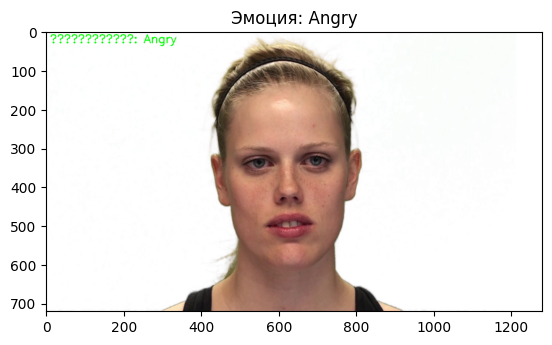

Эмоция: Angry
1/1 [==============================] - 0s 21ms/step


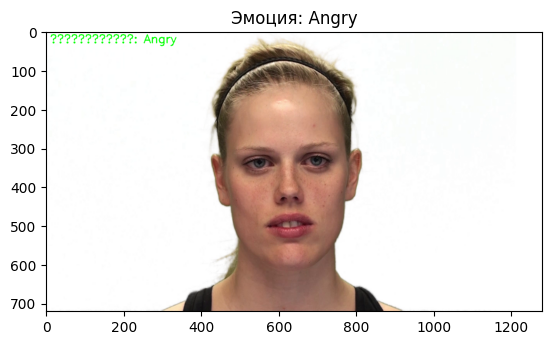

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


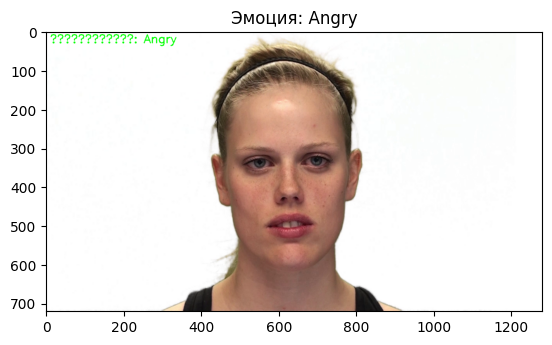

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


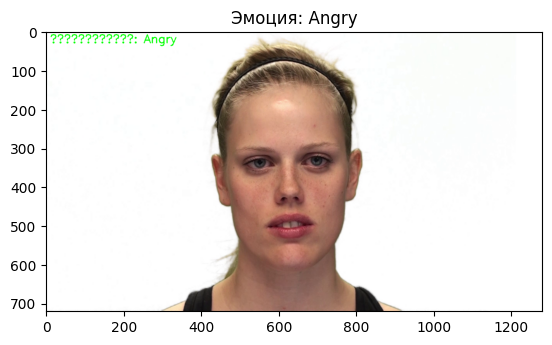

Эмоция: Angry
1/1 [==============================] - 0s 18ms/step


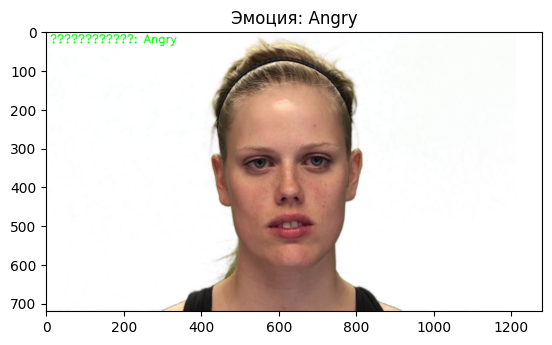

Эмоция: Angry
1/1 [==============================] - 0s 20ms/step


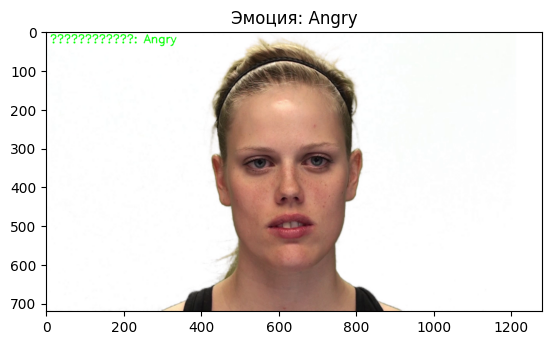

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


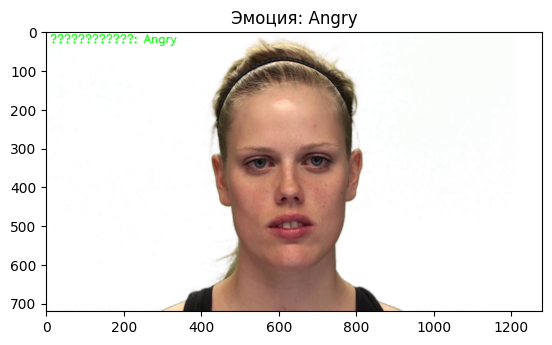

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


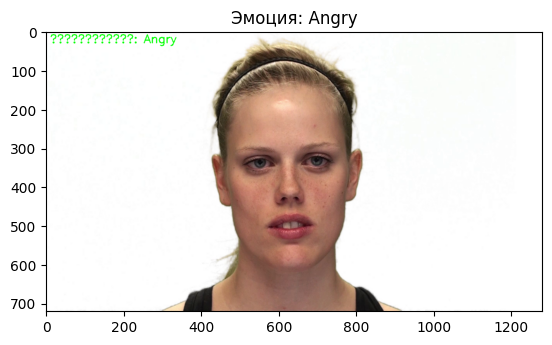

Эмоция: Angry
1/1 [==============================] - 0s 18ms/step


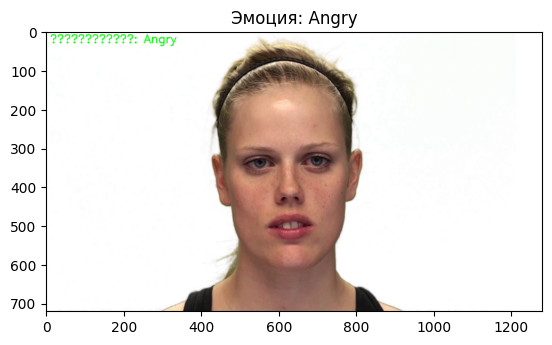

Эмоция: Angry
1/1 [==============================] - 0s 21ms/step


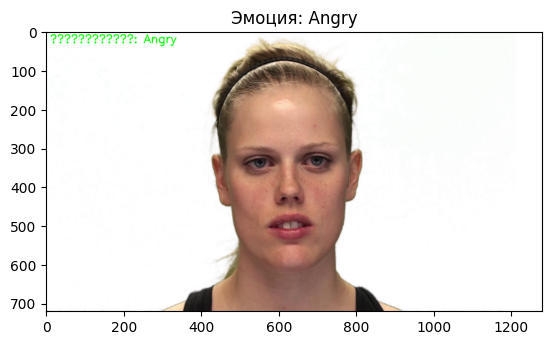

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


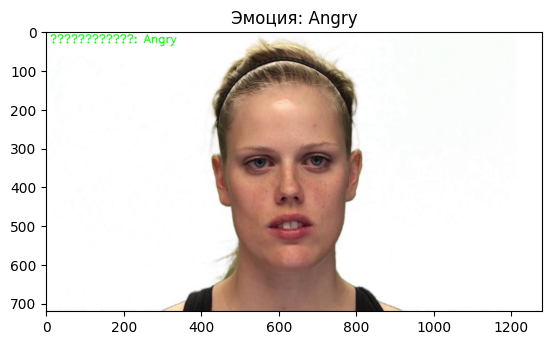

Эмоция: Angry
1/1 [==============================] - 0s 18ms/step


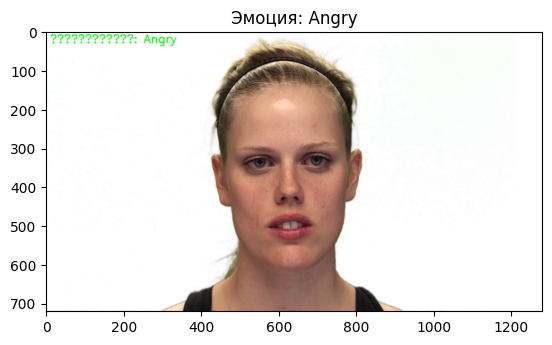

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


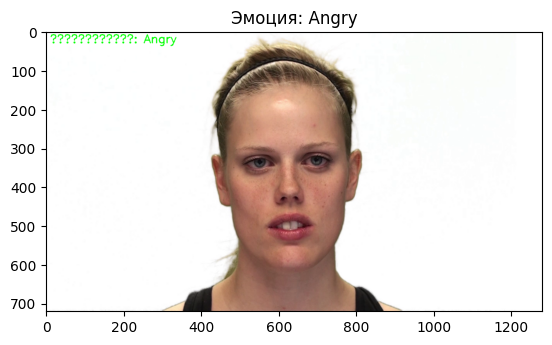

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


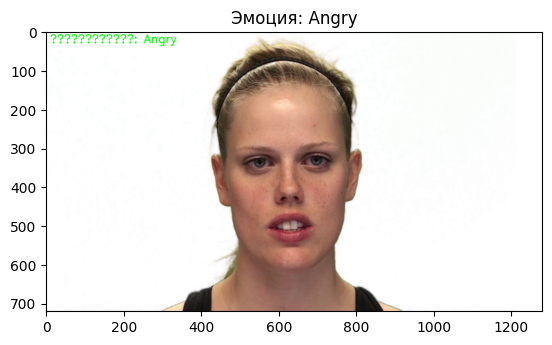

Эмоция: Angry
1/1 [==============================] - 0s 20ms/step


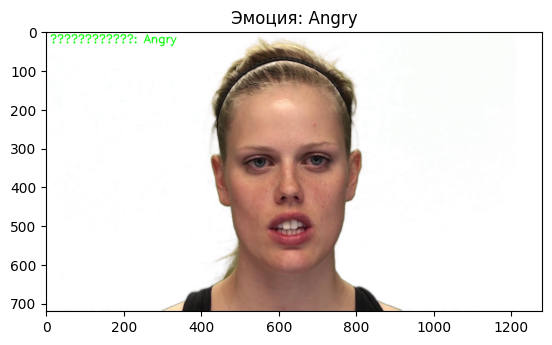

Эмоция: Angry
1/1 [==============================] - 0s 20ms/step


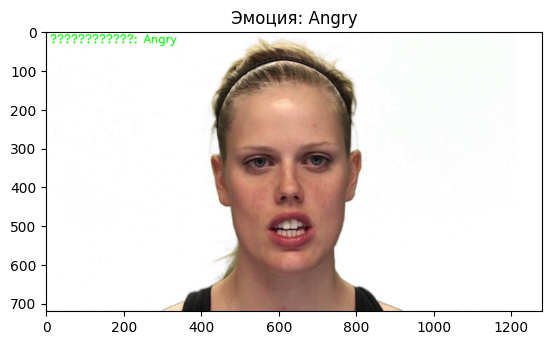

Эмоция: Angry
1/1 [==============================] - 0s 22ms/step


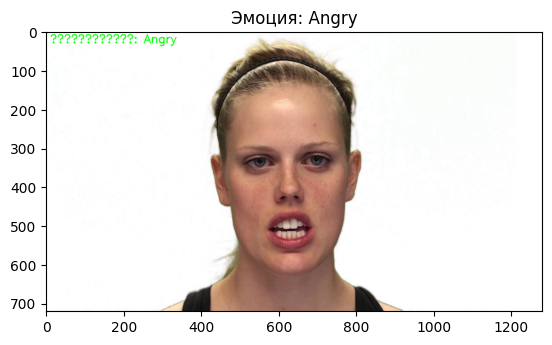

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


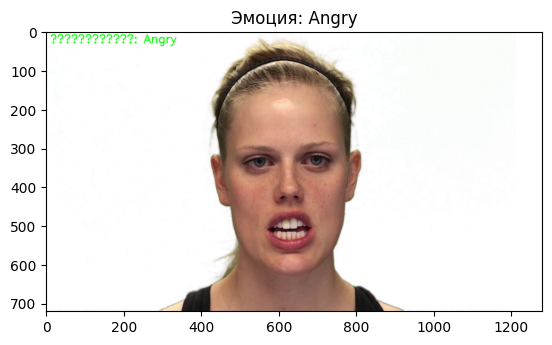

Эмоция: Angry
1/1 [==============================] - 0s 20ms/step


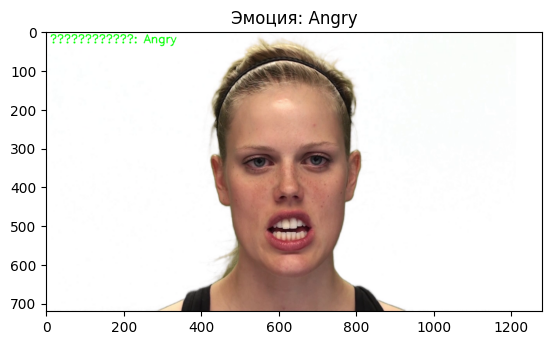

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


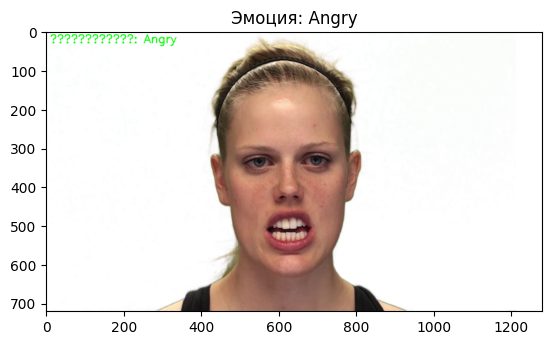

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


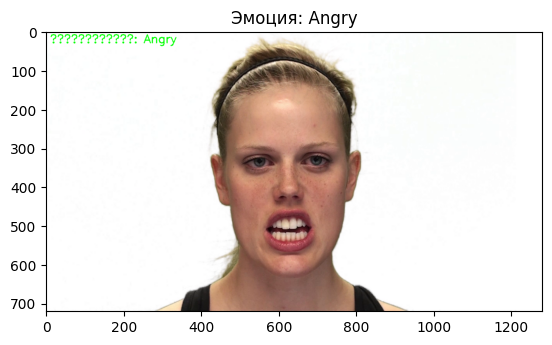

Эмоция: Angry
1/1 [==============================] - 0s 20ms/step


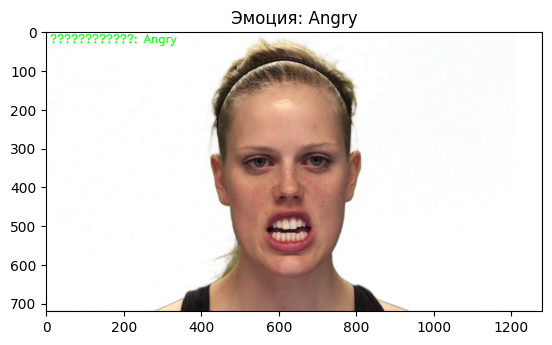

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


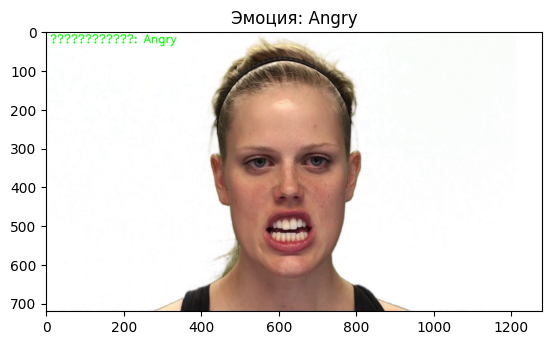

Эмоция: Angry
1/1 [==============================] - 0s 21ms/step


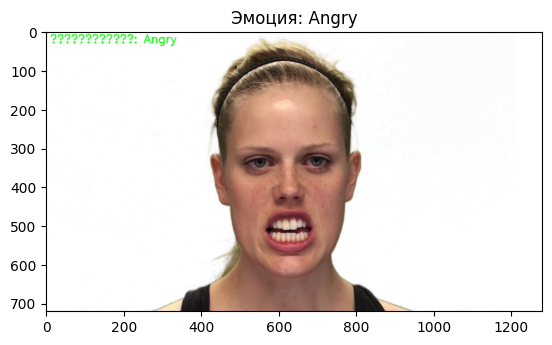

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


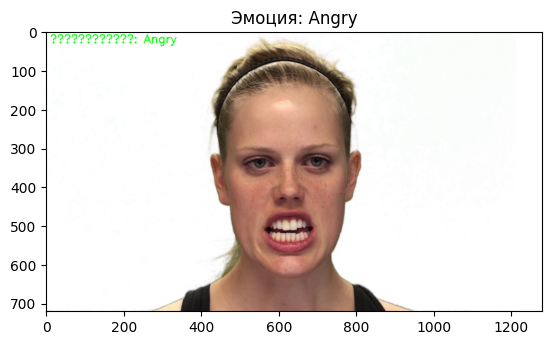

Эмоция: Angry
1/1 [==============================] - 0s 20ms/step


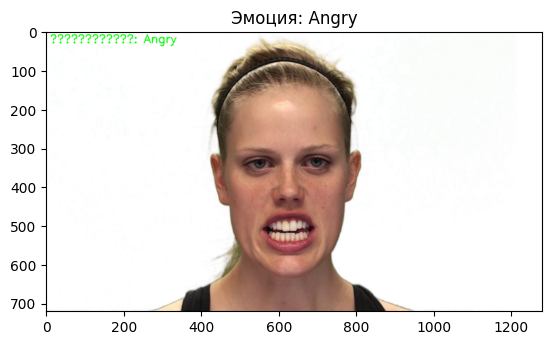

Эмоция: Angry
1/1 [==============================] - 0s 21ms/step


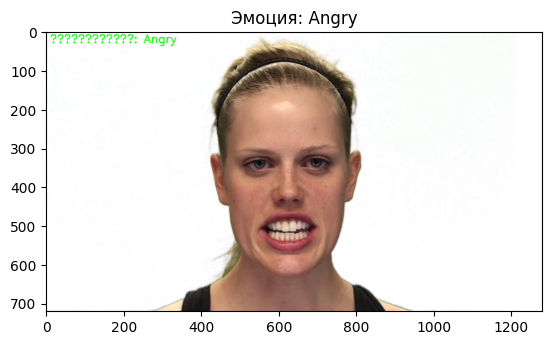

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


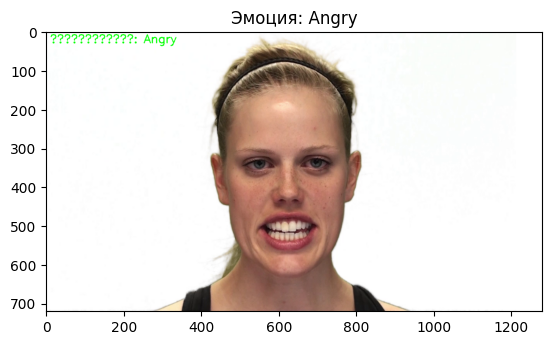

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


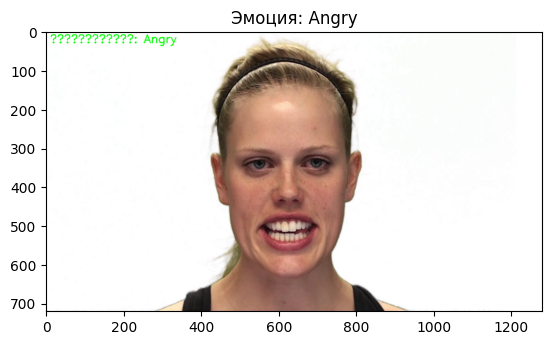

Эмоция: Angry
1/1 [==============================] - 0s 20ms/step


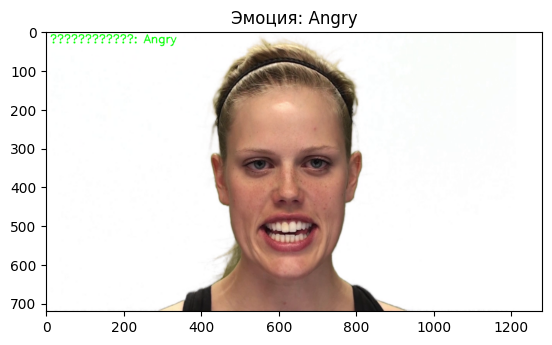

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


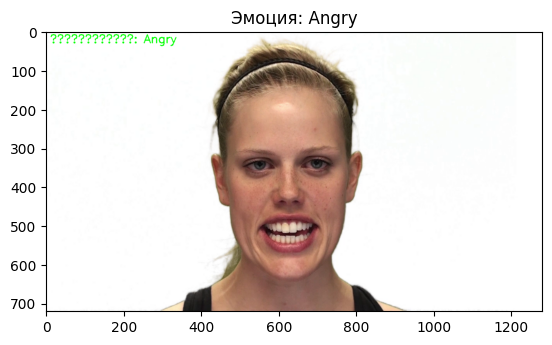

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


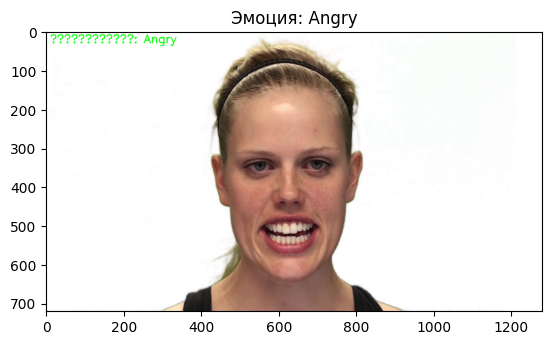

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


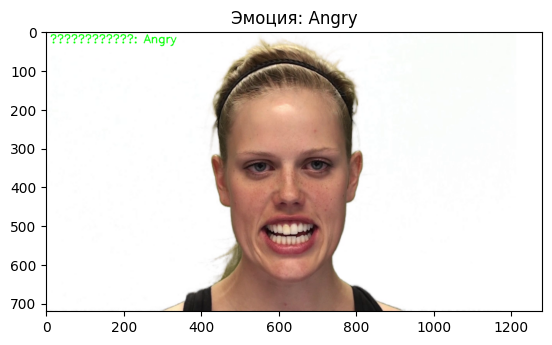

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


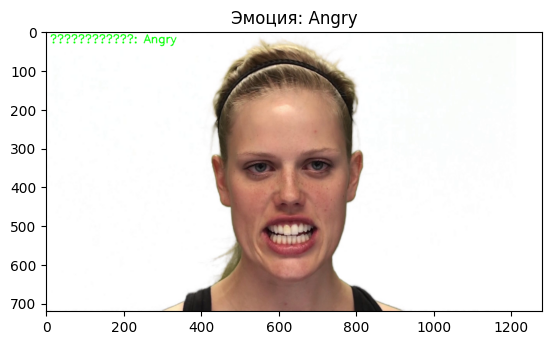

Эмоция: Angry
1/1 [==============================] - 0s 20ms/step


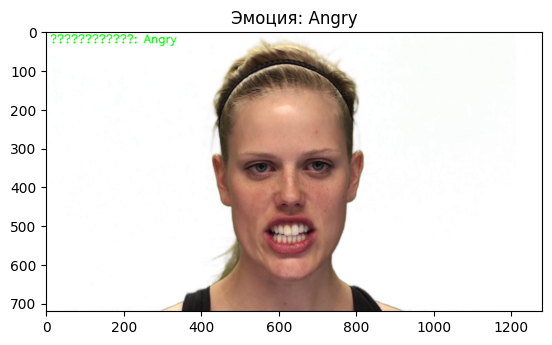

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


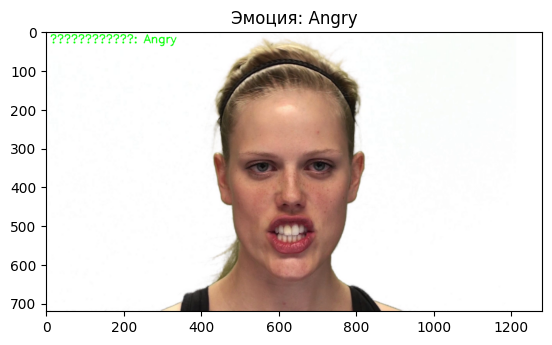

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


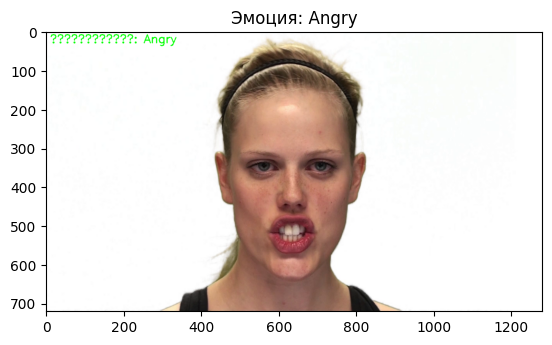

Эмоция: Angry
1/1 [==============================] - 0s 20ms/step


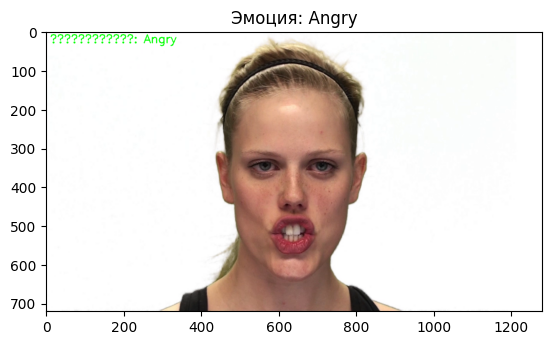

Эмоция: Angry
1/1 [==============================] - 0s 20ms/step


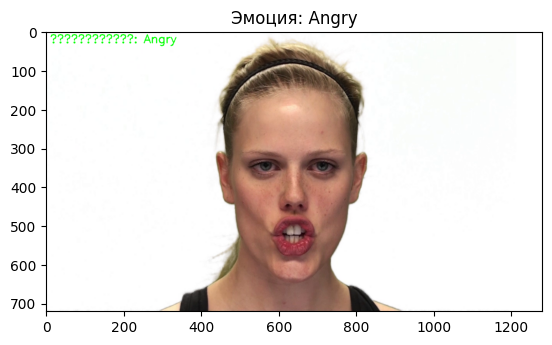

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


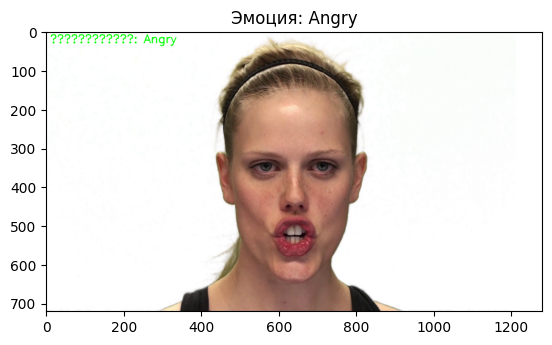

Эмоция: Angry
1/1 [==============================] - 0s 20ms/step


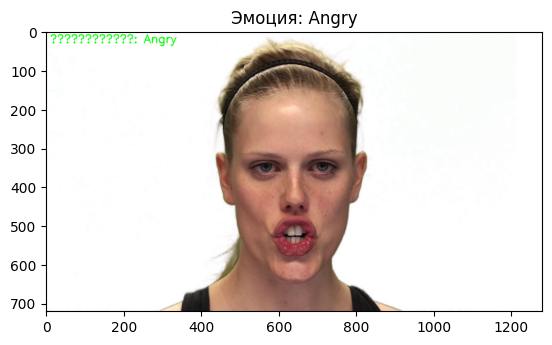

Эмоция: Angry
1/1 [==============================] - 0s 20ms/step


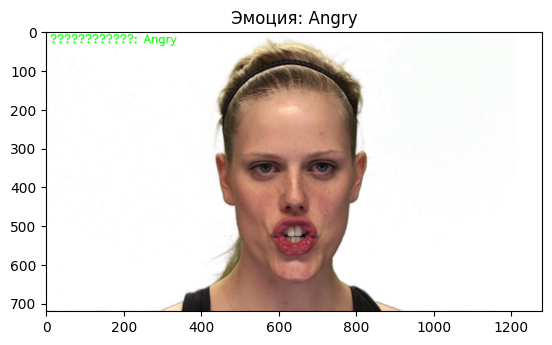

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


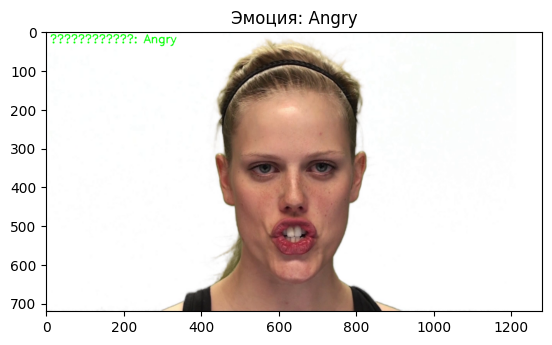

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


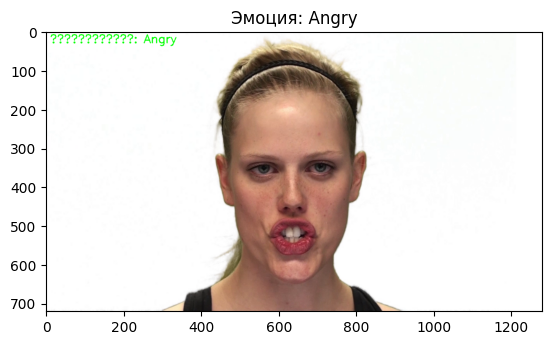

Эмоция: Angry
1/1 [==============================] - 0s 22ms/step


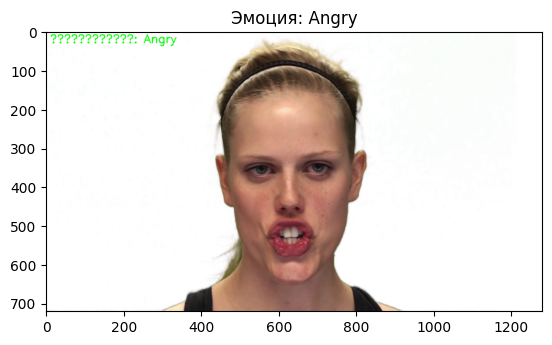

Эмоция: Angry
1/1 [==============================] - 0s 22ms/step


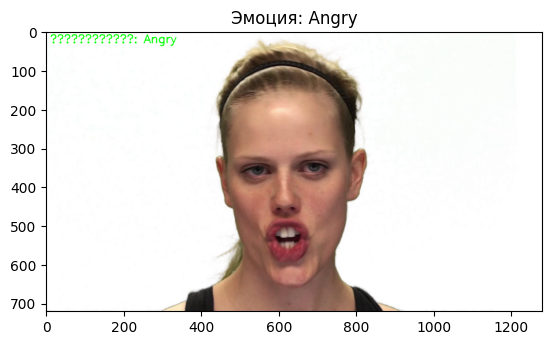

Эмоция: Angry
1/1 [==============================] - 0s 22ms/step


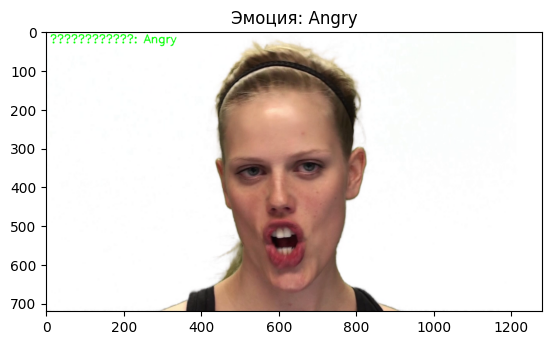

Эмоция: Angry
1/1 [==============================] - 0s 23ms/step


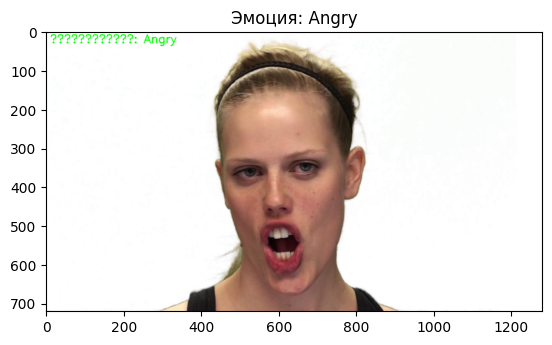

Эмоция: Angry
1/1 [==============================] - 0s 22ms/step


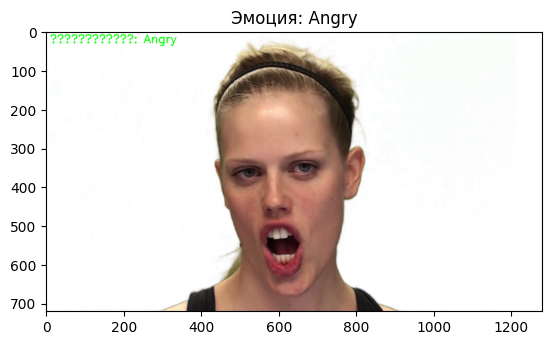

Эмоция: Angry
1/1 [==============================] - 0s 25ms/step


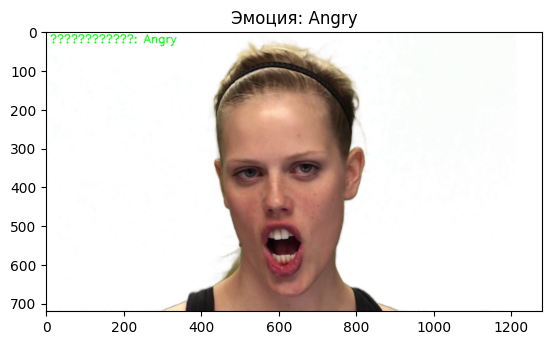

Эмоция: Angry
1/1 [==============================] - 0s 23ms/step


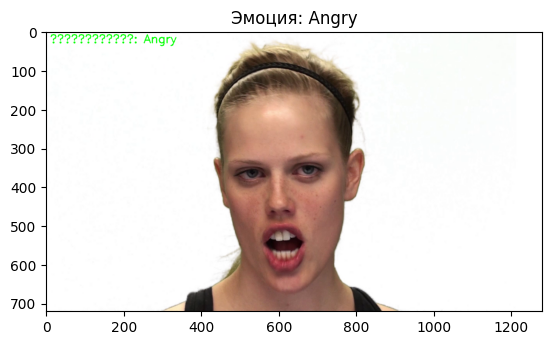

Эмоция: Angry
1/1 [==============================] - 0s 23ms/step


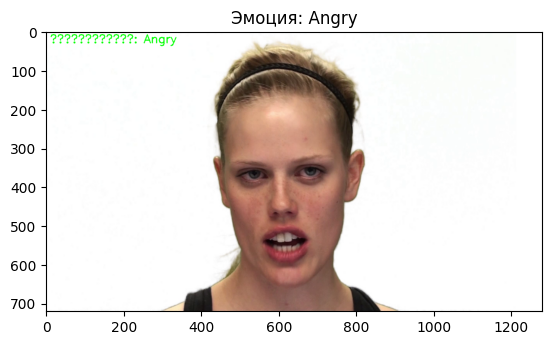

Эмоция: Angry
1/1 [==============================] - 0s 20ms/step


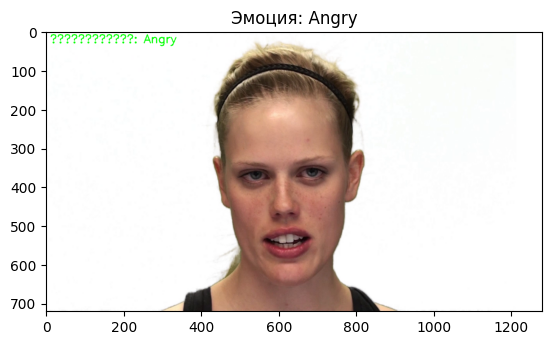

Эмоция: Angry
1/1 [==============================] - 0s 21ms/step


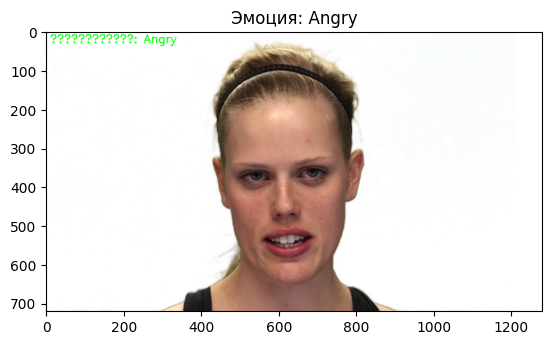

Эмоция: Angry
1/1 [==============================] - 0s 22ms/step


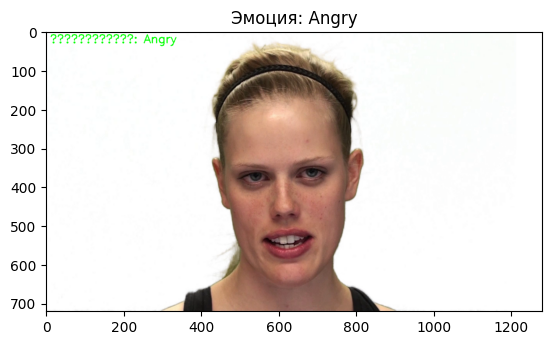

Эмоция: Angry
1/1 [==============================] - 0s 20ms/step


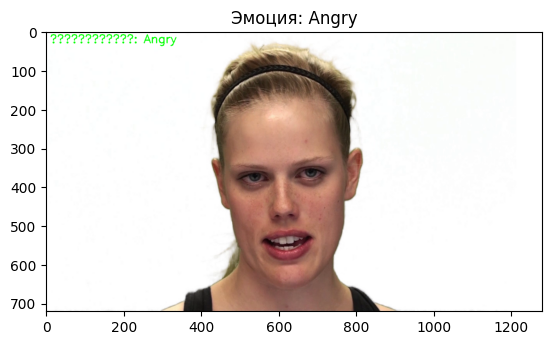

Эмоция: Angry
1/1 [==============================] - 0s 20ms/step


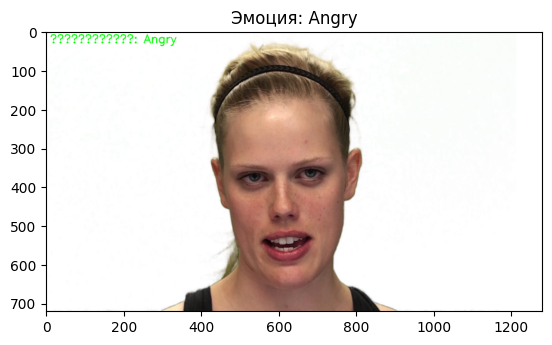

Эмоция: Angry
1/1 [==============================] - 0s 21ms/step


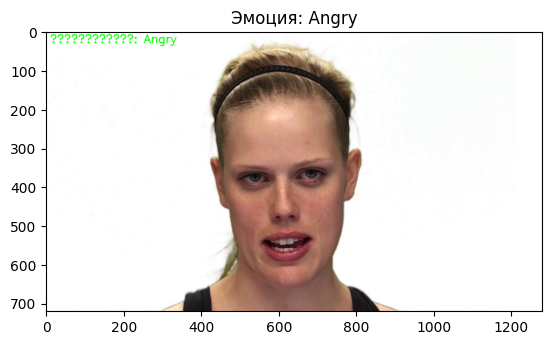

Эмоция: Angry
1/1 [==============================] - 0s 21ms/step


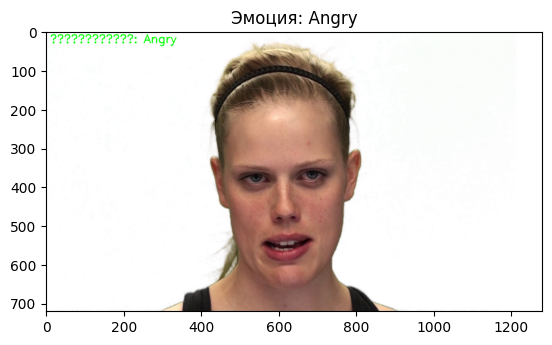

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


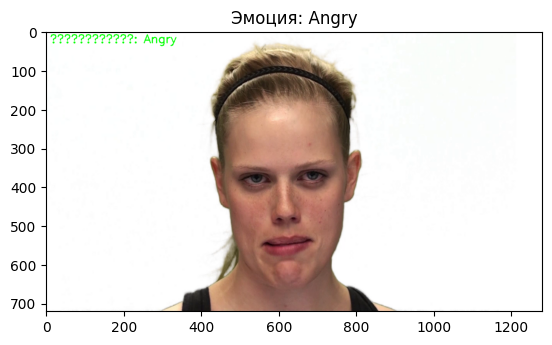

Эмоция: Angry
1/1 [==============================] - 0s 20ms/step


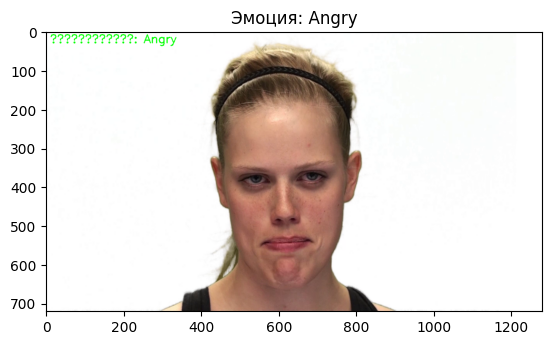

Эмоция: Angry
1/1 [==============================] - 0s 20ms/step


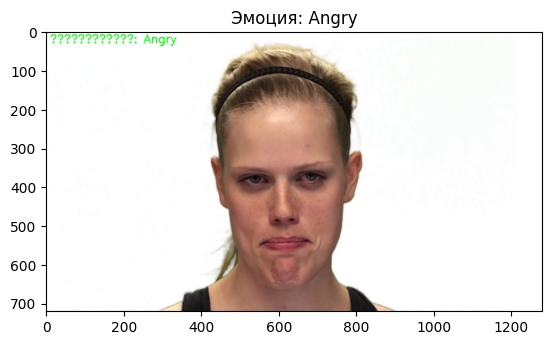

Эмоция: Angry
1/1 [==============================] - 0s 20ms/step


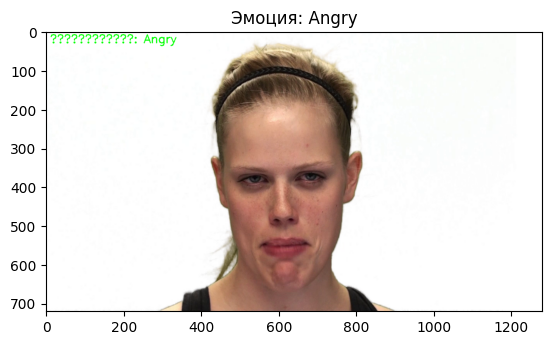

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


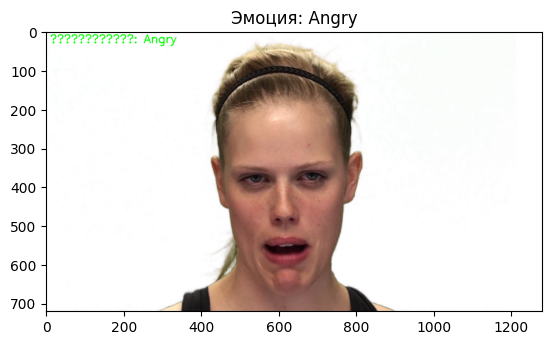

Эмоция: Angry
1/1 [==============================] - 0s 24ms/step


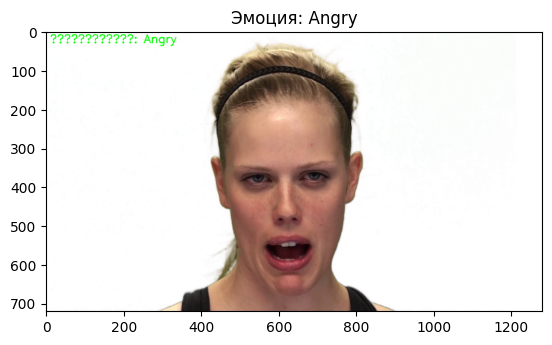

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


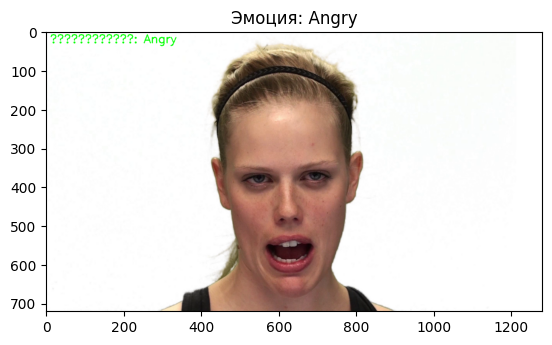

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


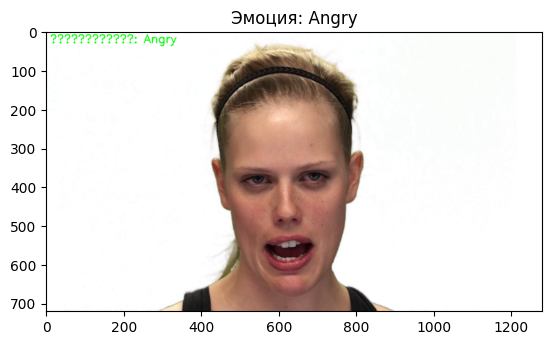

Эмоция: Angry
1/1 [==============================] - 0s 21ms/step


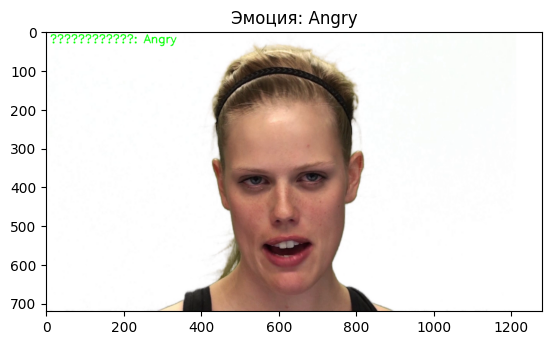

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


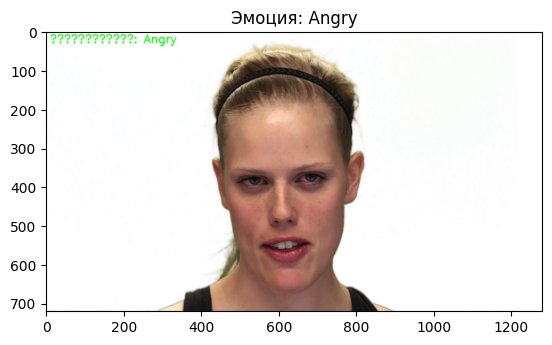

Эмоция: Angry
1/1 [==============================] - 0s 21ms/step


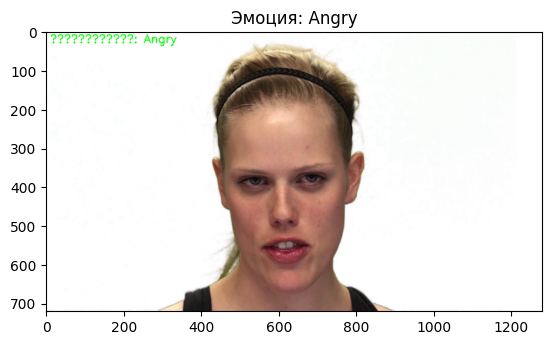

Эмоция: Angry
1/1 [==============================] - 0s 21ms/step


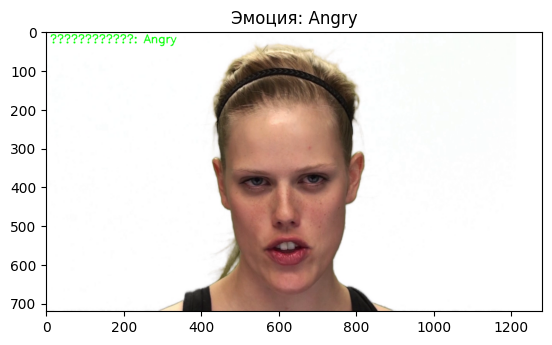

Эмоция: Angry
1/1 [==============================] - 0s 20ms/step


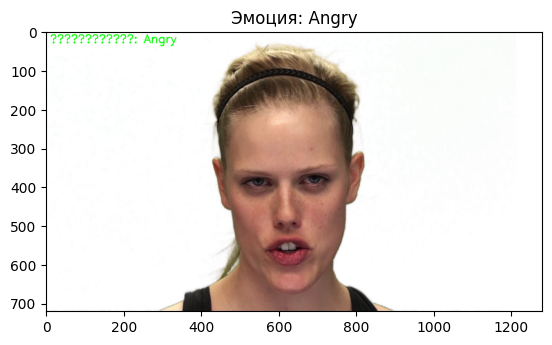

Эмоция: Angry
1/1 [==============================] - 0s 20ms/step


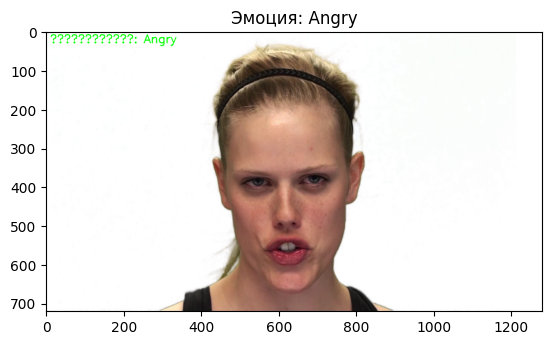

Эмоция: Angry
1/1 [==============================] - 0s 21ms/step


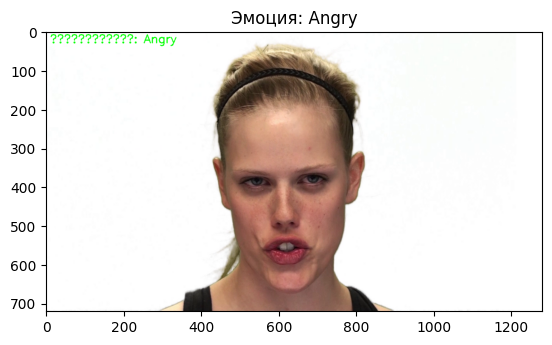

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


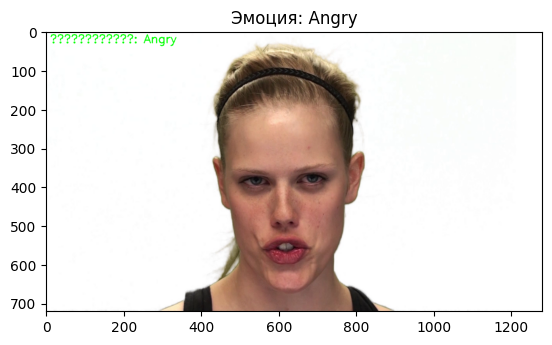

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


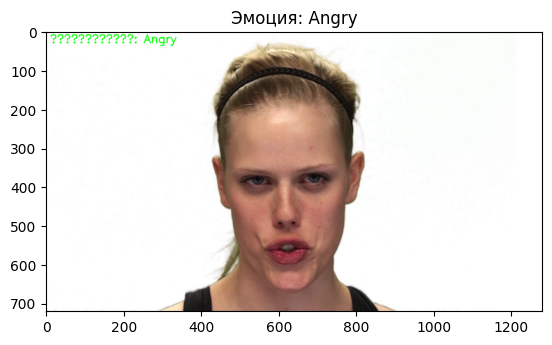

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


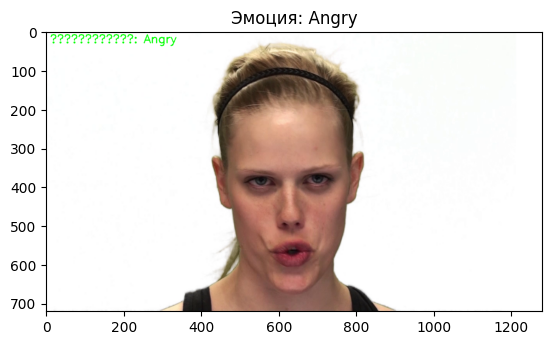

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


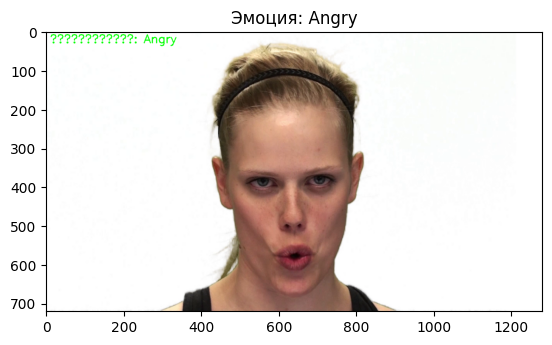

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


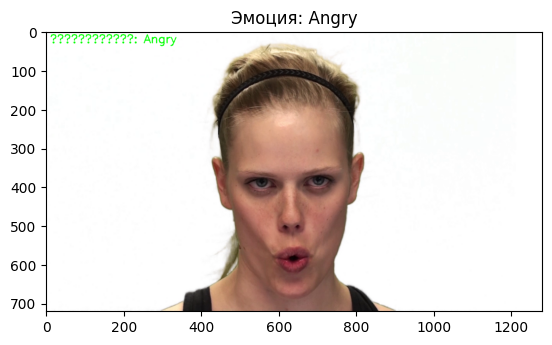

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


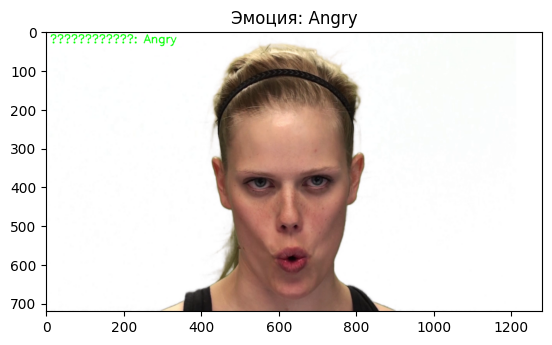

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


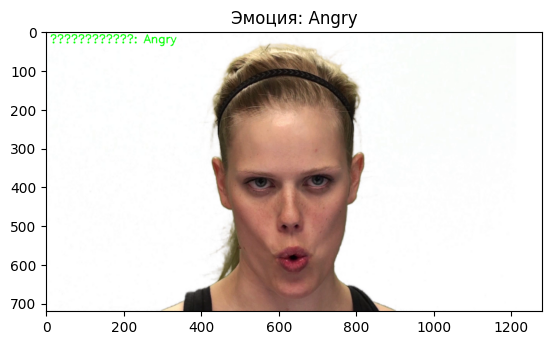

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


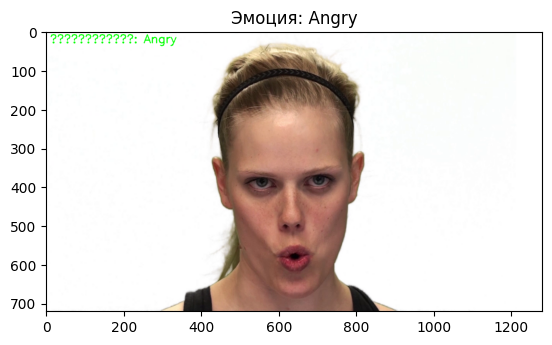

Эмоция: Angry
1/1 [==============================] - 0s 22ms/step


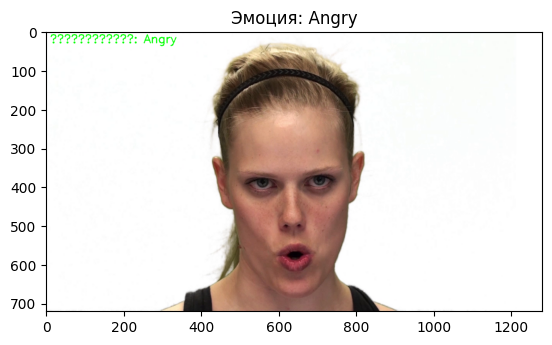

Эмоция: Angry
1/1 [==============================] - 0s 20ms/step


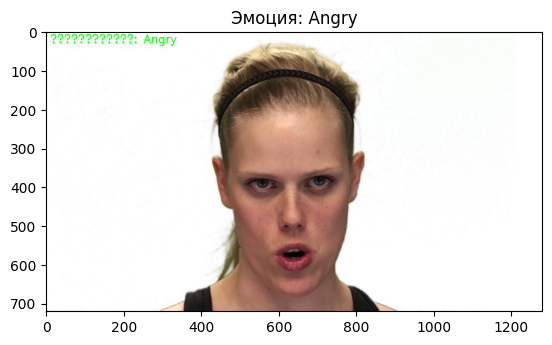

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


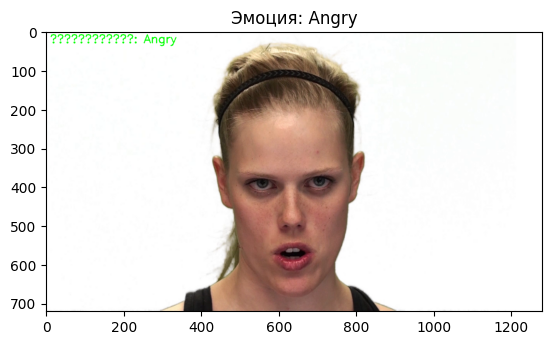

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


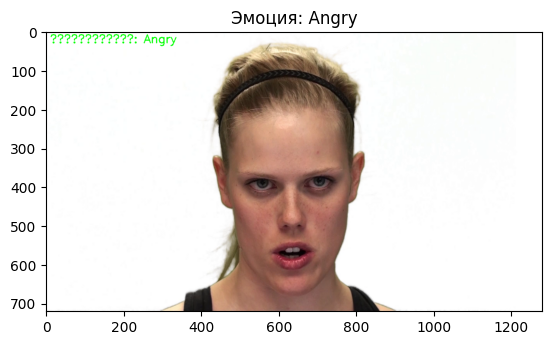

Эмоция: Angry
1/1 [==============================] - 0s 20ms/step


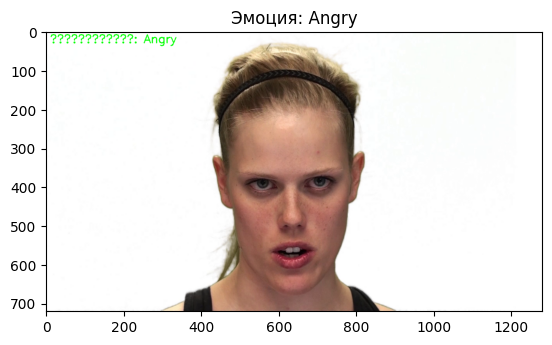

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


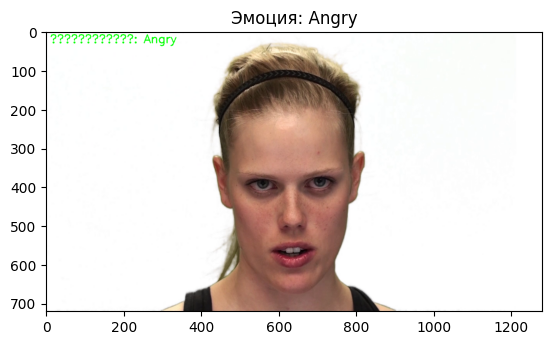

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


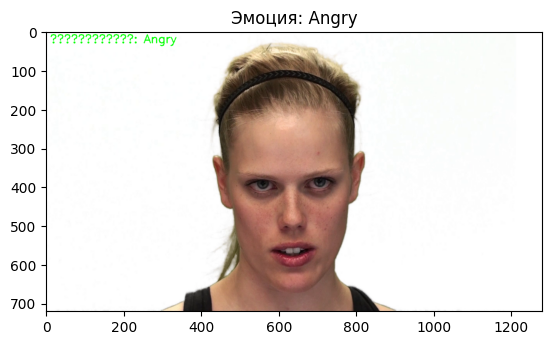

Эмоция: Angry
1/1 [==============================] - 0s 20ms/step


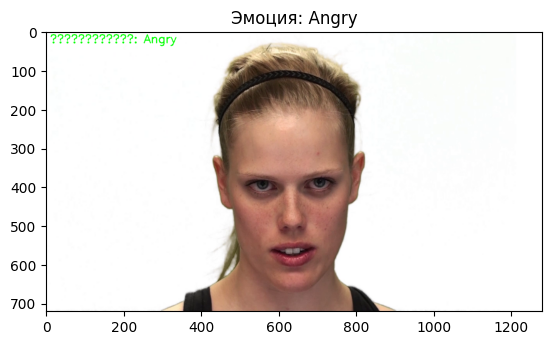

Эмоция: Angry
1/1 [==============================] - 0s 20ms/step


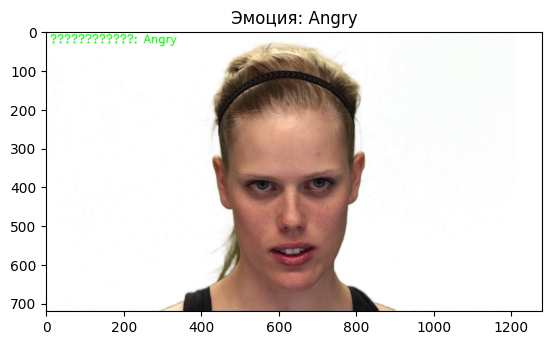

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


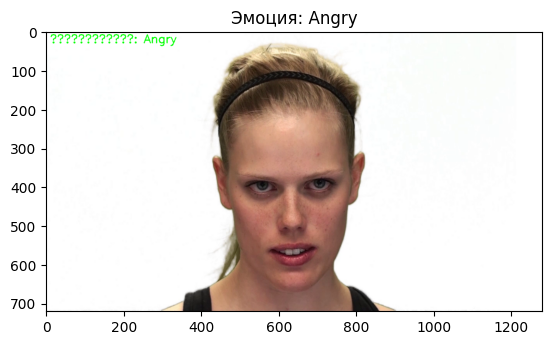

Эмоция: Angry
1/1 [==============================] - 0s 18ms/step


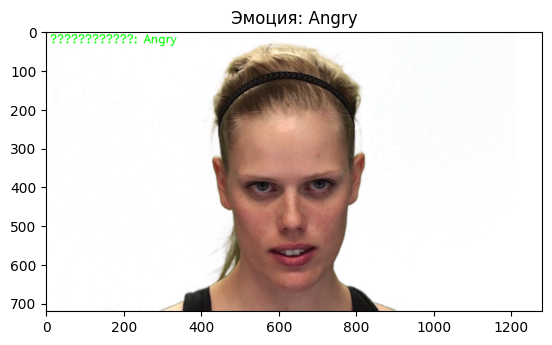

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


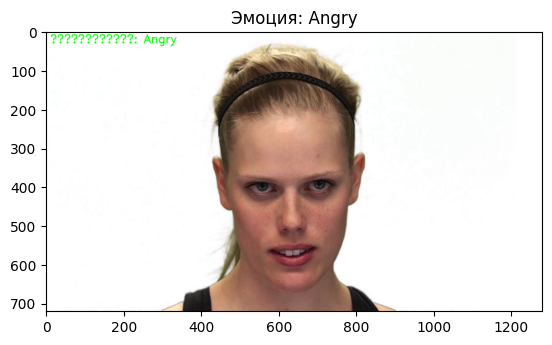

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


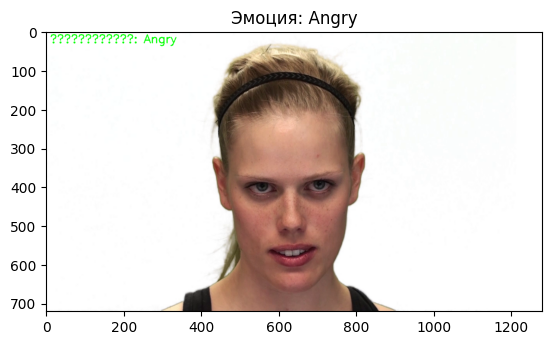

Эмоция: Angry
1/1 [==============================] - 0s 20ms/step


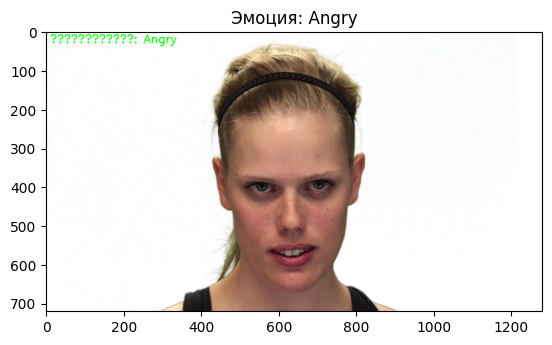

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


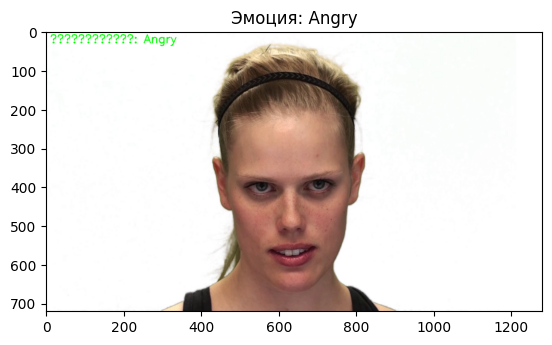

Эмоция: Angry
1/1 [==============================] - 0s 20ms/step


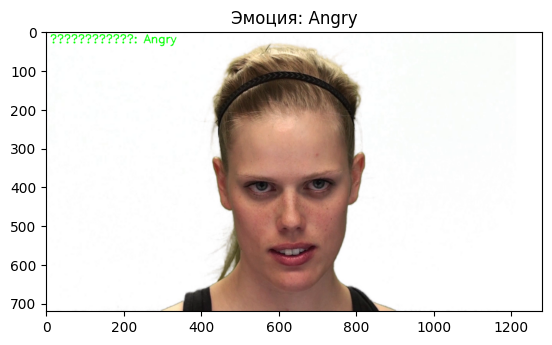

Эмоция: Angry
1/1 [==============================] - 0s 20ms/step


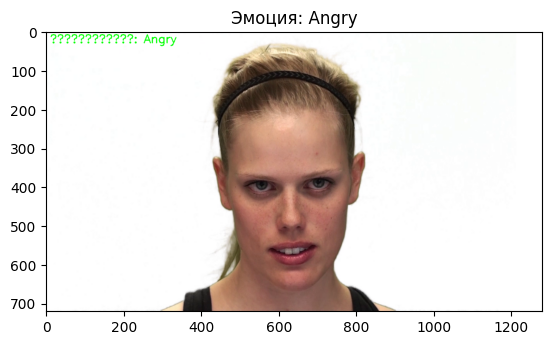

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


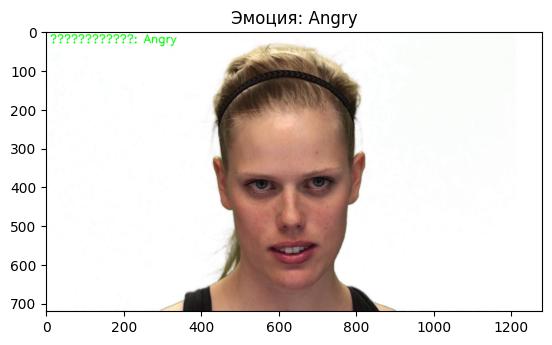

Эмоция: Angry
1/1 [==============================] - 0s 20ms/step


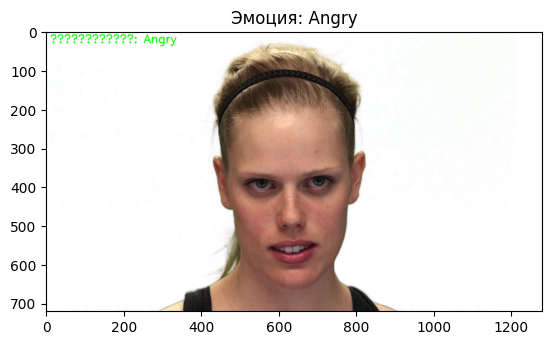

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


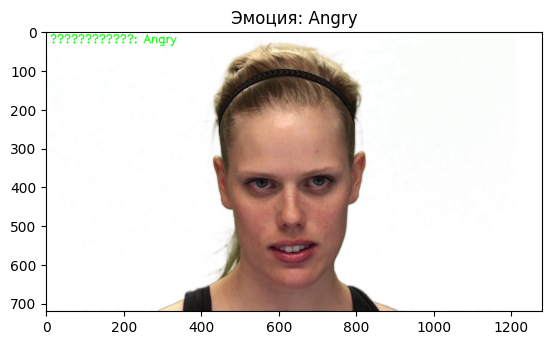

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


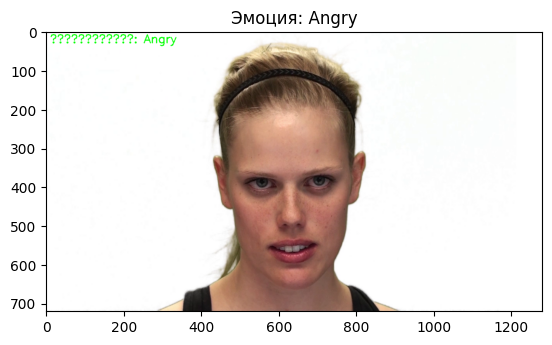

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


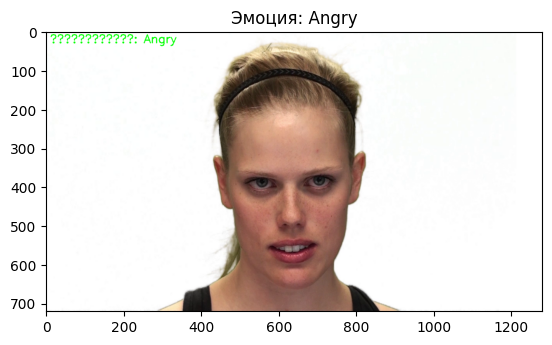

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


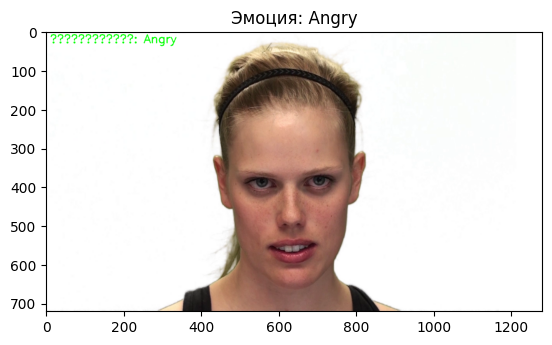

Эмоция: Angry
1/1 [==============================] - 0s 20ms/step


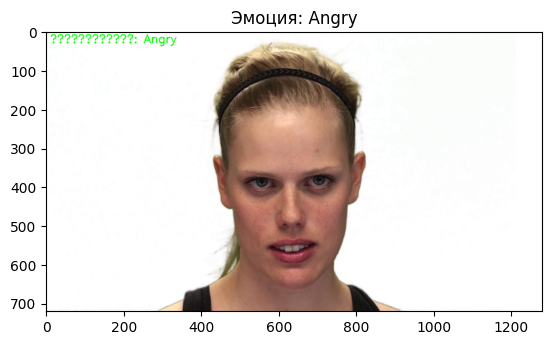

Эмоция: Angry
1/1 [==============================] - 0s 20ms/step


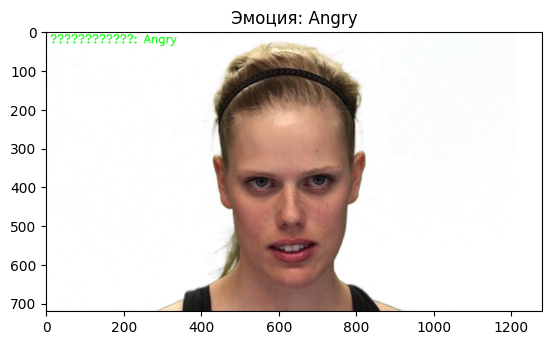

Эмоция: Angry
1/1 [==============================] - 0s 20ms/step


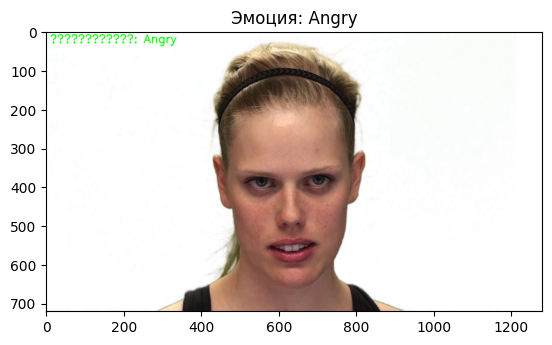

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


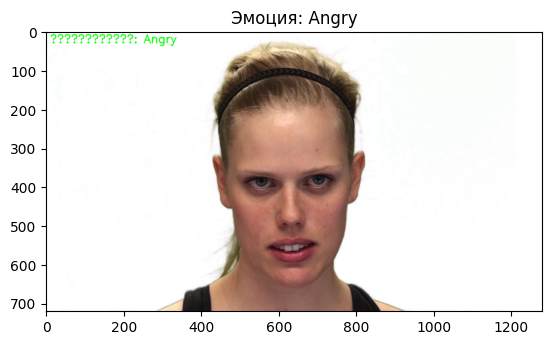

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


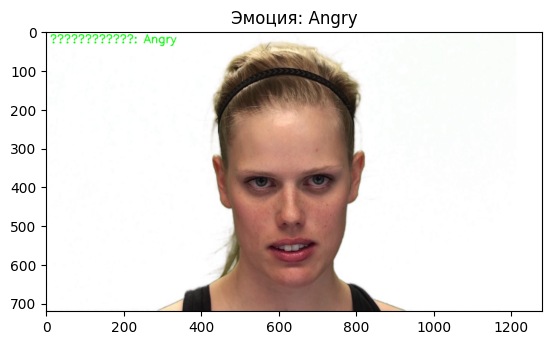

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


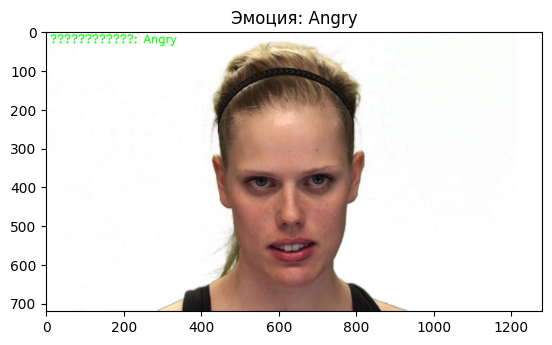

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


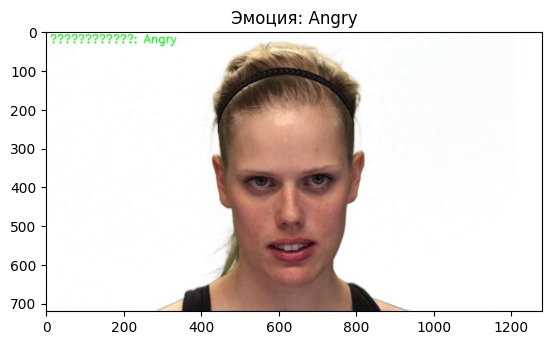

Эмоция: Angry
1/1 [==============================] - 0s 19ms/step


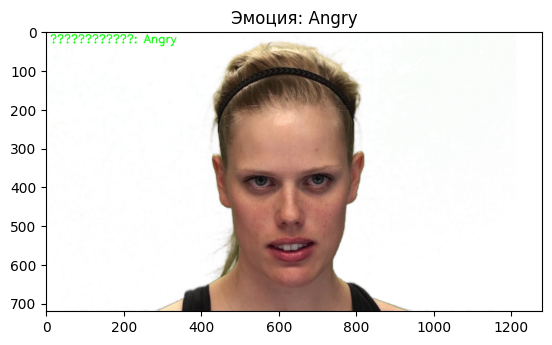

Эмоция: Angry
1/1 [==============================] - 0s 20ms/step


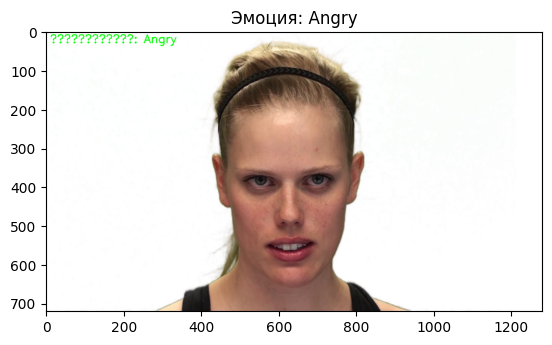

Эмоция: Angry
1/1 [==============================] - 0s 18ms/step


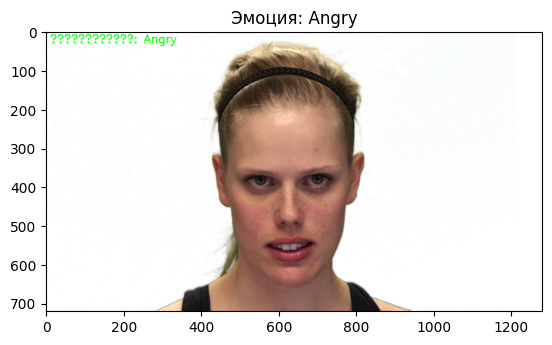

Эмоция: Angry
1/1 [==============================] - 0s 20ms/step


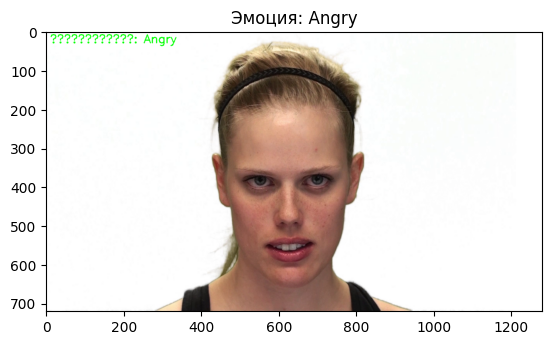

Эмоция: Angry


In [ ]:
import cv2
import numpy as np
import time

# Предполагается, что 'cap' где-то определен в вашем коде
# Например, вы можете его инициализировать так: cap = cv2.VideoCapture('your_video.mp4')

while True:
    ret, frame = cap.read()
    if not ret:
        break

    # Изменение размера изображения до размера, используемого для обучения модели
    frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    frame_resized = cv2.resize(frame_gray, (48, 48))
    frame_normalized = frame_resized / 255.0

    # Добавление дополнительных размерностей (batch_size и channels) для модели
    input_data = np.expand_dims(np.expand_dims(frame_normalized, axis=-1), axis=0)

    # Предсказание эмоции
    predictions = model.predict(input_data)
    emotion_label_index = np.argmax(predictions)
    emotion_label = emotion_labels[emotion_label_index]

    # Отображение результата на кадре
    cv2.putText(frame, f'Эмоция: {emotion_label}', (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)

    # Отображение кадра с использованием matplotlib
    plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    plt.title(f'Эмоция: {emotion_label}')
    plt.show()

    print(f'Эмоция: {emotion_label}')

    # Задержка между кадрами (в секундах)
    time.sleep(0.1)

# Освобождение объекта захвата
cap.release()
